# Data Science in Julia

### Data visualization

**by Yueh-Hua Tu**

## Gadfly

In [1]:
using DataFrames
using RDatasets
using Gadfly

## Just plot!

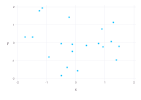

In [2]:
plot(x=randn(20), y=randn(20))

## Add lines and points

* Geom.point
* Geom.line

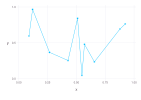

In [3]:
plot(x=rand(10), y=rand(10), Geom.point, Geom.line)

## Scaling, geometry, guide

* Scale
* Geom
* Guide

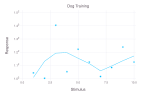

In [4]:
plot(x=1:10, y=2 .^ rand(10), Scale.y_sqrt, Geom.point, Geom.smooth,
     Guide.xlabel("Stimulus"), Guide.ylabel("Response"), Guide.title("Dog Training"))

## Save figure

```julia
plt = plot(..)

draw(SVG("myplot.svg", 4inch, 3inch), plt)
draw(PNG("myplot.png", 4inch, 3inch), plt)
draw(PDF("myplot.pdf", 4inch, 3inch), plt)
draw(PS("myplot.ps", 4inch, 3inch), plt)
draw(D3("myplot.js", 4inch, 3inch), plt)
```

If save to png file, you will need this:

```julia
import Cairo, Fontconfig
```

## Interactive plot

```julia
draw(SVGJS("foo.svg", 12cm, 9cm), plt)
```

#### Static svg image
```
<img src="foo.svg"/>
```

#### Interactive svg image
```
<object data="foo.svg" type="image/svg+xml"></object>
```

## Plotting DataFrame

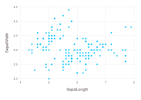

In [5]:
iris = dataset("datasets", "iris")
plot(iris, x="SepalLength", y="SepalWidth", Geom.point)

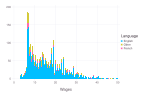

In [6]:
plot(dataset("car", "SLID"), x="Wages", color="Language", Geom.histogram)

## Plotting functions and expressions

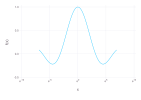

In [7]:
plot(x -> sin(x)/x, 0.001, 1000, Scale.x_log)

## Plotting multiple functions

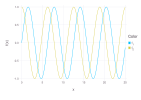

In [8]:
plot([sin, cos], 0, 25)

# Geometry

# Show one-dimensional data

## Histogram

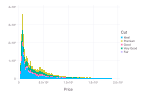

In [9]:
diamonds = dataset("ggplot2", "diamonds")
plot(diamonds, x="Price", color="Cut", Geom.histogram)

## Density function

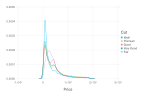

In [10]:
plot(diamonds, x="Price", color="Cut", Geom.density)

## Show two-dimensional data

* Numerical v.s. numerical
* Numerical v.s. categorical
* Categorical v.s. categorical

# Numerical v.s. numerical

## Scatter plot

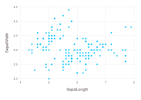

In [11]:
plot(iris, x="SepalLength", y="SepalWidth", Geom.point)

## Hexbin plot

In [12]:
using Distributions

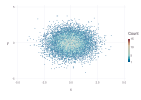

In [13]:
mn = MultivariateNormal([0.0, 0.0], [1.0 0.01; 0.01 1.0])
X = rand(mn, 10000)
plot(x=X[1,:], y=X[2,:], Geom.hexbin)

## Two-dimensional density plot (joint probability distribution)

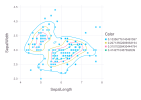

In [14]:
plot(iris, x="SepalLength", y="SepalWidth", Geom.point, Geom.density2d(levels=4))

## Contour plot for function

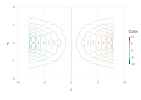

In [15]:
plot(z=(x,y) -> x*exp(-(x-round(Int, x))^2-y^2),
     x=range(-8,stop=8,length=150), y=range(-2,stop=2,length=150), Geom.contour)

## Contour plot for matrix

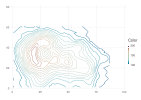

In [16]:
volcano = convert(Array{Float64}, dataset("datasets", "volcano"))
plot(z=volcano, Geom.contour)

## Vector field

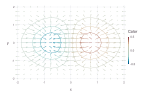

In [17]:
coord = Coord.cartesian(xmin=-2, xmax=2, ymin=-2, ymax=2)
plot(coord, z=(x,y)->x*exp(-(x^2+y^2)), x=-2:0.25:2.0, y=-2:0.25:2.0,
     Geom.vectorfield(scale=0.4), Geom.contour(levels=6),
     Scale.x_continuous(minvalue=-2.0, maxvalue=2.0),
     Scale.y_continuous(minvalue=-2.0, maxvalue=2.0))

# Numerical v.s. categorical

## Box plot

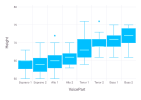

In [18]:
plot(dataset("lattice", "singer"), x="VoicePart", y="Height", Geom.boxplot)

## Beeswarm plot

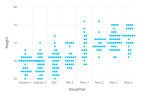

In [19]:
plot(dataset("lattice", "singer"), x="VoicePart", y="Height", Geom.beeswarm)

## Violin plot

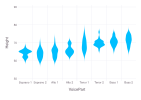

In [20]:
plot(dataset("lattice", "singer"), x="VoicePart", y="Height", Geom.violin)

## Line plot

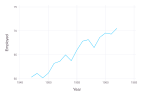

In [21]:
longley = dataset("datasets", "longley")
p = plot(longley, x="Year", y="Employed", Geom.line)

# Categorical v.s. categorical

## Rectangle bins

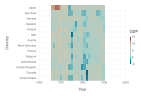

In [22]:
plot(dataset("Zelig", "macro"), x="Year", y="Country", color="GDP", Geom.rectbin)

## Heatmap

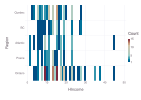

In [23]:
plot(dataset("car", "Womenlf"), x="HIncome", y="Region", Geom.histogram2d)

# Advanced usage

## Layers

In [24]:
xdata = sort(iris.SepalWidth)
ydata = cumsum(xdata);

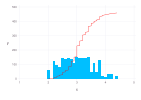

In [25]:
line = layer(x=xdata, y=ydata, Geom.line, Theme(default_color="red"))
bars = layer(iris, x=:SepalWidth, Geom.bar)
plot(line, bars)

## Adding to a plot

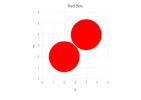

In [26]:
p = plot()
push!(p, layer(x=[2,4], y=[2,4], size=[1.4142], color=[colorant"red"]))
push!(p, Coord.cartesian(fixed=true))
push!(p, Guide.title("Red dots"))

## Facets

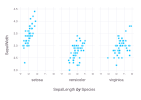

In [27]:
plot(iris, xgroup="Species", x="SepalLength", y="SepalWidth", Geom.subplot_grid(Geom.point))

## Facets

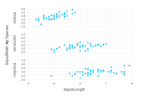

In [28]:
plot(iris, ygroup="Species", x="SepalLength", y="SepalWidth", Geom.subplot_grid(Geom.point))

## Stacks

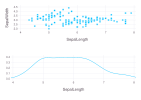

In [29]:
fig1a = plot(iris, x=:SepalLength, y=:SepalWidth, Geom.point)
fig1b = plot(iris, x=:SepalLength, Geom.density, Coord.cartesian(xmin=4, xmax=8))
vstack(fig1a,fig1b)

## Grid

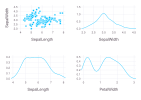

In [30]:
fig1c = plot(iris, x=:SepalWidth, Geom.density, Coord.cartesian(xmin=2, xmax=4.5))
fig1d = plot(iris, x=:PetalWidth, Geom.density, Coord.cartesian(xmin=0., xmax=3.))
gridstack([fig1a fig1c; fig1b fig1d])

## Themes

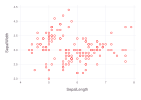

In [31]:
plot(iris, x=:SepalLength, y=:SepalWidth, Geom.point,
     Theme(discrete_highlight_color=x->"red", default_color="white"))

## Push and pop themes

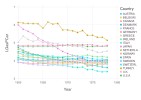

In [32]:
gasoline = dataset("Ecdat", "Gasoline")
plot(gasoline, x=:Year, y=:LGasPCar, color=:Country, Geom.point, Geom.line)

## Push and pop themes

In [33]:
latex_fonts = Theme(major_label_font="CMU Serif", major_label_font_size=16pt,
                    key_label_font="CMU Serif", key_label_font_size=10pt)
Gadfly.push_theme(latex_fonts)

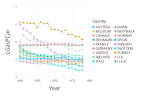

In [34]:
gasoline = dataset("Ecdat", "Gasoline")
p = plot(gasoline, x=:Year, y=:LGasPCar, color=:Country, Geom.point, Geom.line)

In [35]:
Gadfly.pop_theme();

## Theme context

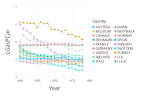

In [36]:
Gadfly.with_theme(latex_fonts) do
    plot(gasoline, x=:Year, y=:LGasPCar, color=:Country, Geom.point, Geom.line)
end

## Named themes

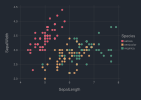

In [37]:
Gadfly.with_theme(:dark) do
    plot(iris, x=:SepalLength, y=:SepalWidth, color=:Species)
end

## Named themes

In [38]:
Gadfly.get_theme(::Val{:orange}) = Theme(default_color="orange")

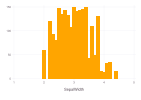

In [39]:
Gadfly.with_theme(:orange) do
    plot(iris, x=:SepalWidth, Geom.bar)
end

# Plots

In [40]:
using Plots, StatsPlots, Distances, Clustering

## Pie chart

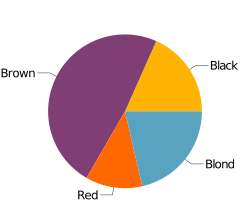

In [41]:
haireyecolor = dataset("datasets", "HairEyeColor")
haircolor = by(haireyecolor, :Hair, Freq=:Freq => sum)
pie(haircolor[!, :Hair], haircolor[!, :Freq]; size=(250, 200))

## Dendrogram

In [42]:
D = pairwise(Euclidean(), Matrix(iris[:, 1:4]), dims=1)
result = hclust(D, linkage=:single);

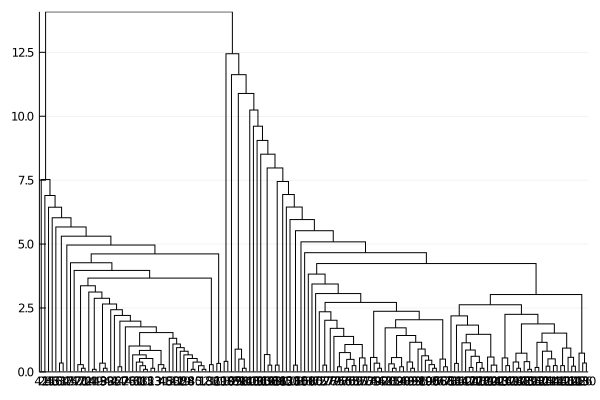

In [43]:
StatsPlots.plot(result)

## Marginal histogram

┌ Warning: Attribute alias `ylabel` detected in the plot recipe defined for the signature (::Type{Val{:marginalhist}}, ::AbstractPlot). To ensure expected behavior it is recommended to use the default attribute `yguide`.
└ @ Plots /home/yuehhua/.julia/packages/Plots/8GUYs/src/pipeline.jl:15
┌ Warning: Attribute alias `xlabel` detected in the plot recipe defined for the signature (::Type{Val{:marginalhist}}, ::AbstractPlot). To ensure expected behavior it is recommended to use the default attribute `xguide`.
└ @ Plots /home/yuehhua/.julia/packages/Plots/8GUYs/src/pipeline.jl:15
┌ Warning: Attribute alias `ylabel` detected in the plot recipe defined for the signature (::Type{Val{:marginalhist}}, ::AbstractPlot). To ensure expected behavior it is recommended to use the default attribute `yguide`.
└ @ Plots /home/yuehhua/.julia/packages/Plots/8GUYs/src/pipeline.jl:15
┌ Warning: Attribute alias `xlabel` detected in the plot recipe defined for the signature (::Type{Val{:marginalhist}}, ::Abs

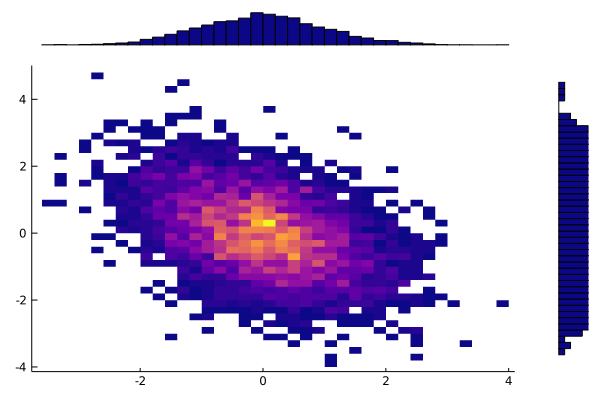

In [44]:
n = 5000
x = randn(n)
y = -0.5x + randn(n)
marginalhist(x, y, fc=:plasma, bins=40)

## 3D plot

In [45]:
n = 500
x = range(-8., stop=8., length=n)
y = range(-2., stop=2., length=n)
f(x,y) = x*exp(-(x-round(Int, x))^2-y^2)

f (generic function with 1 method)

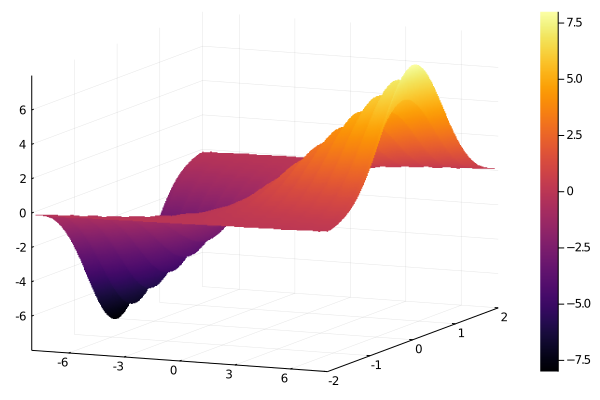

In [46]:
Plots.plot(x, y, f, st=:surface)

## 3D animate

┌ Info: Saved animation to 
│   fn = /media/yuehhua/Workbench/Lessons/julia_programming/materials/tmp.gif
└ @ Plots /home/yuehhua/.julia/packages/Plots/8GUYs/src/animation.jl:102


Plots.AnimatedGif("/media/yuehhua/Workbench/Lessons/julia_programming/materials/tmp.gif")
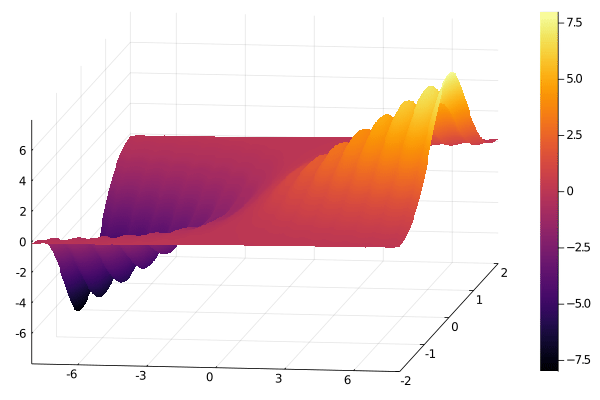

In [47]:
@gif for i in range(0, stop=2π, length=100)
    p = Plots.plot(x, y, f, st=:surface)
    Plots.plot!(p, camera=(15*cos(i), 40))
end